# Generating damaged boxes using Titan Image Generator (preview)

> This notebook should work well with the **`Data Science 3.0`** kernel in SageMaker Studio and with the **`conda_python3`** in a SageMaker Notebook Instance.

---

In this demo notebook, we show how to use [Titan Image Generator](https://docs.aws.amazon.com/bedrock/latest/userguide/titan-image-models.html) on [Amazon Bedrock](https://aws.amazon.com/bedrock/) for image generation (text-to-image).

Amazon Titan models incorporate 25 years of artificial intelligence (AI) and machine learning (ML) innovation at Amazon and offer a range of high-performing image, multimodal, and text model options through a fully managed API. AWS pre-trained these models on large datasets, making them powerful, general-purpose models built to support a variety of use cases while also supporting the responsible use of AI.

## Setup

⚠️ ⚠️ ⚠️ Before running this notebook, ensure you've run the [Bedrock boto3 setup notebook](bedrock_boto3_setup.ipynb#Prerequisites) notebook. ⚠️ ⚠️ ⚠️


In [6]:
# Python Built-Ins:
import base64
import io
import json
import os
import sys
import time

# External Dependencies:
import boto3
from PIL import Image
from io import BytesIO
from datetime import datetime

module_path = ".."
sys.path.append(os.path.abspath(module_path))
from utils import bedrock, print_ww


# ---- ⚠️ Un-comment and edit the below lines as needed for your AWS setup ⚠️ ----

# os.environ["AWS_DEFAULT_REGION"] = "<REGION_NAME>"  # E.g. "us-east-1"
# os.environ["AWS_PROFILE"] = "<YOUR_PROFILE>"
# os.environ["BEDROCK_ASSUME_ROLE"] = "<YOUR_ROLE_ARN>"  # E.g. "arn:aws:..."

boto3_bedrock = bedrock.get_bedrock_client(
    assumed_role=os.environ.get("BEDROCK_ASSUME_ROLE", None),
    region=os.environ.get("AWS_DEFAULT_REGION", None),
)
bedrock_runtime = boto3.client(service_name="bedrock-runtime")
s3 = boto3.client('s3')

ModuleNotFoundError: No module named 'utils'

## Generate a damaged / normal paper box

In text-to-image mode, we'll provide a text description of what image **should** be generated, called a `prompt`.

ImageGenerationConfig Options:
* numberOfImages: Number of images to be generated
* quality: Quality of generated images, can be standard or premium
* height: Height of output image(s)
* width: Width of output image(s)
* cfgScale: Scale for classifier-free guidance
* seed: The seed to use for reproducibility  

In [3]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-images/normal/"
prompt = "a normal carton box"
negative_prompt = "poorly rendered, damaged"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 9       # Range: 1.0 (exclusive) to 10.0
seed = 21478            # Range: 0 to 214783647

The Amazon Bedrock `InvokeModel` provides access to titan-image-generator by setting the right model ID, and returns a JSON response including a [Base64 encoded string](https://en.wikipedia.org/wiki/Base64) that represents the (PNG) image.

For more information on available input parameters for the model, refer to the [Titan Image Generator blog](https://aws.amazon.com/ko/blogs/aws/amazon-titan-image-generator-multimodal-embeddings-and-text-models-are-now-available-in-amazon-bedrock/).

The cell below invokes the SDXL model through Amazon Bedrock to create an initial image string:

In [4]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
           "negativeText": negative_prompt # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": numberOfImages,
            "quality": quality,
            "height": height,
            "width": width,
            "cfgScale": cfgScale,
            "seed": seed
        }
    }
)
modelId = "amazon.titan-image-generator-v1"

response = boto3_bedrock.invoke_model(
    body=body, 
    modelId=modelId,
    accept="application/json", 
    contentType="application/json"
)
response_body = json.loads(response.get("body").read())

images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

NameError: name 'json' is not defined

In [5]:
for index, img in enumerate(images):
    IMAGE_KEY = prefix + "random_generated_" + datetime.today().strftime("%Y-%m-%d-%H:%M:%S") + "-" + str(index) + ".png"
    print(IMAGE_KEY)
    display(img)    

NameError: name 'images' is not defined

In [131]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-images/damaged/"
prompt = "a damaged carton box"
negative_prompt = "poorly rendered, normal"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 9       # Range: 1.0 (exclusive) to 10.0
seed = 21478            # Range: 0 to 214783647

In [132]:
body = json.dumps(
    {
        "taskType": "TEXT_IMAGE",
        "textToImageParams": {
            "text": prompt,   # Required
           "negativeText": negative_prompt  # Optional
        },
        "imageGenerationConfig": {
            "numberOfImages": numberOfImages,
            "quality": quality,
            "height": height,
            "width": width,
            "cfgScale": cfgScale,
            "seed": seed
        }
    }
)
modelId = "amazon.titan-image-generator-v1"

response = bedrock_runtime.invoke_model(
    body=body, 
    modelId=modelId,
    accept="application/json", 
    contentType="application/json"
)
response_body = json.loads(response.get("body").read())

images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]

reko-images/damaged/random_generated_2023-12-06-14:15:32-0.png


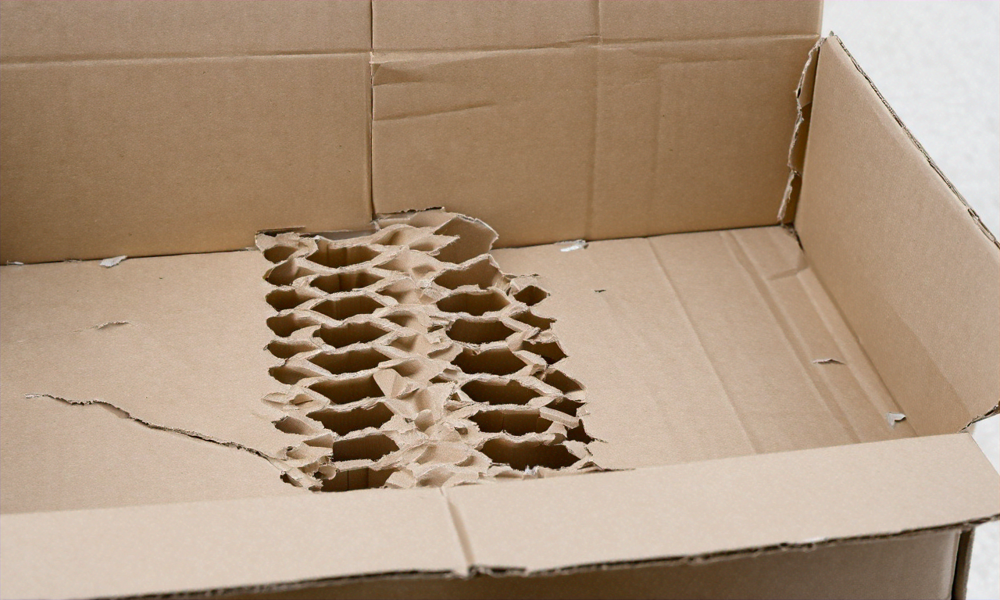

reko-images/damaged/random_generated_2023-12-06-14:15:32-1.png


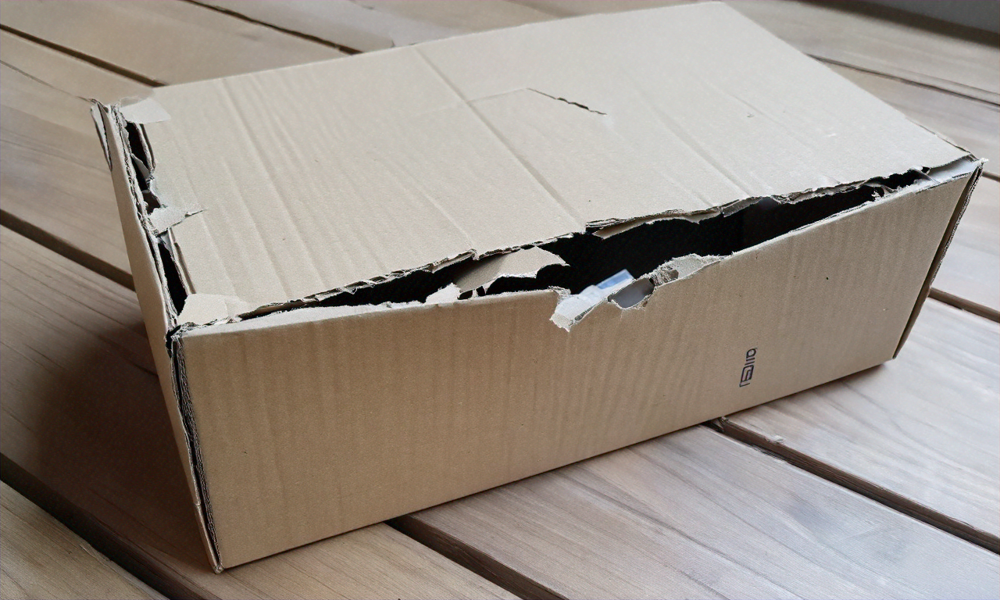

reko-images/damaged/random_generated_2023-12-06-14:15:33-2.png


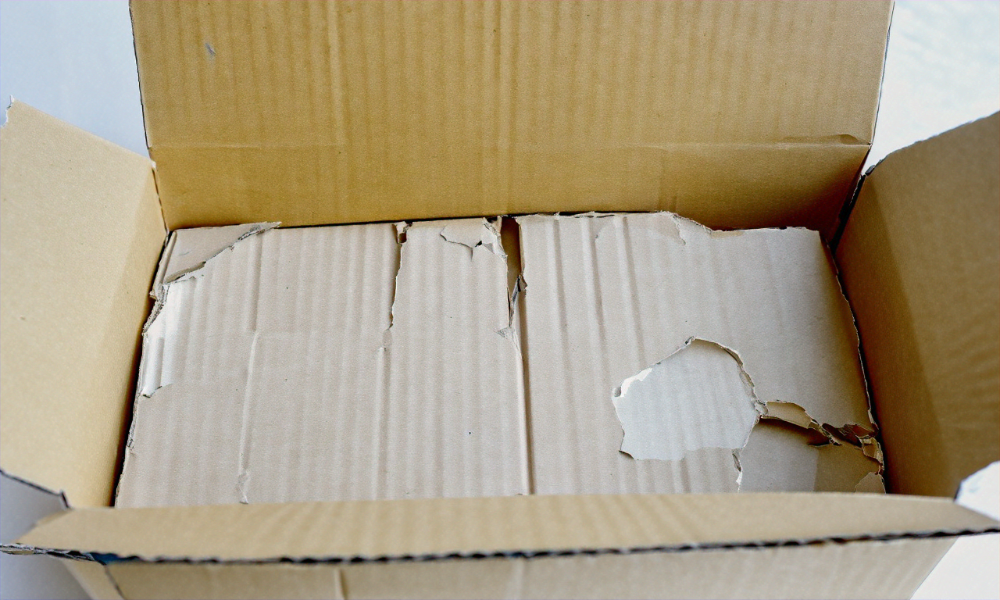

reko-images/damaged/random_generated_2023-12-06-14:15:34-3.png


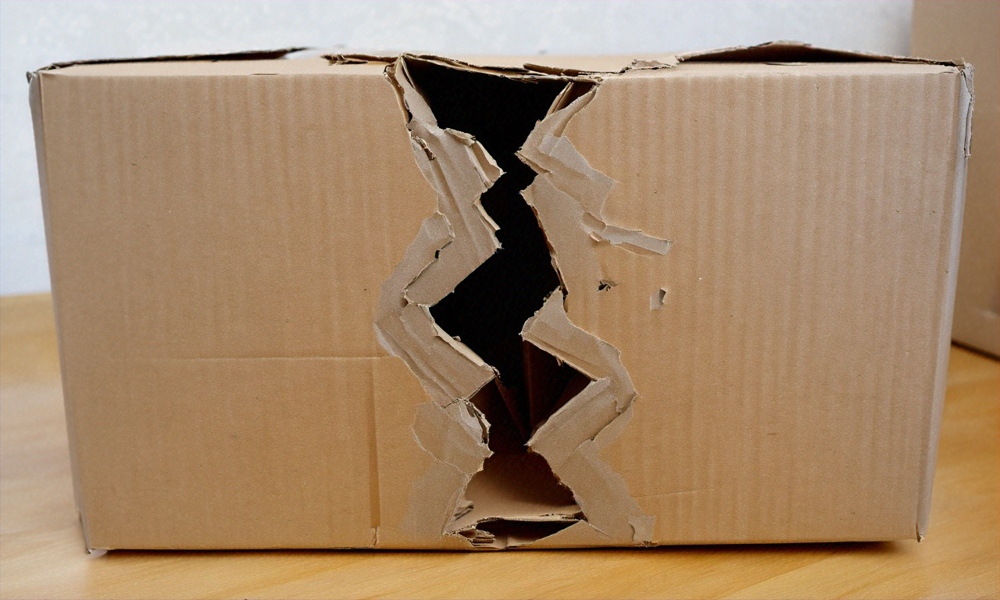

reko-images/damaged/random_generated_2023-12-06-14:15:34-4.png


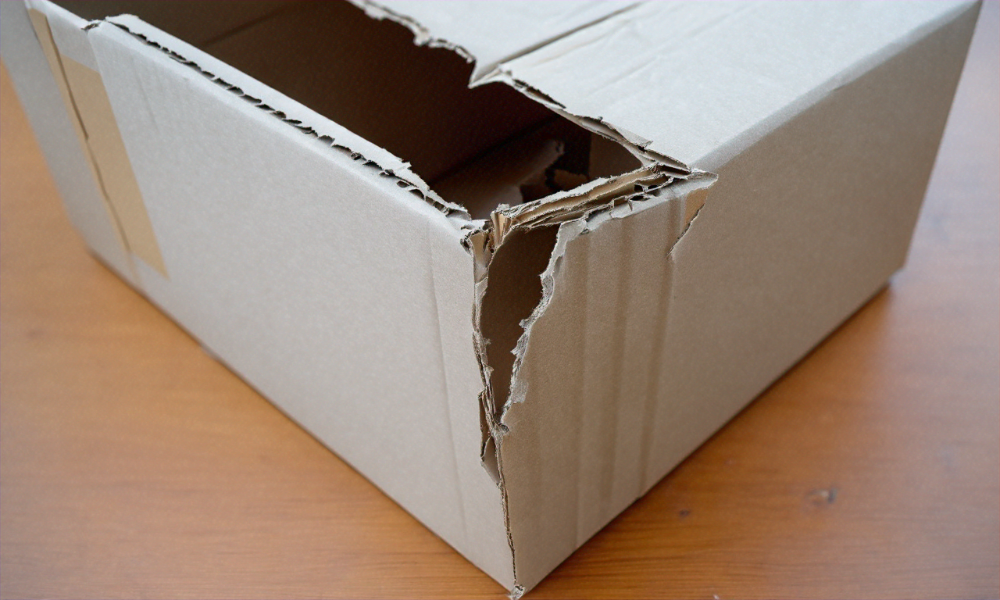

In [133]:
for index, img in enumerate(images):
    IMAGE_KEY = prefix + "random_generated_" + datetime.today().strftime("%Y-%m-%d-%H:%M:%S") + "-" + str(index) + ".png"
    print(IMAGE_KEY)
    display(img)    

## Upload damaged box images to S3

In [134]:
def generateBoxes(prefix, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed):
    
    body = json.dumps(
        {
            "taskType": "TEXT_IMAGE",
            "textToImageParams": {
                "text": prompt,   # Required
               "negativeText": negative_prompt  # Optional
            },
            "imageGenerationConfig": {
                "numberOfImages": numberOfImages,
                "quality": quality,
                "height": height,
                "width": width,
                "cfgScale": cfgScale,
                "seed": seed
            }
        }
    )
    modelId = "amazon.titan-image-generator-v1"

    response = bedrock_runtime.invoke_model(
        body=body, 
        modelId=modelId,
        accept="application/json", 
        contentType="application/json"
    )
    response_body = json.loads(response.get("body").read())
    images = [Image.open(BytesIO(base64.b64decode(base64_image))) for base64_image in response_body.get("images")]
    
    for index, img in enumerate(images):
        IMAGE_KEY = prefix + "random_generated_" + datetime.today().strftime("%Y-%m-%d-%H:%M:%S") + "-" + str(index) + ".png"
        in_mem_file = io.BytesIO()
        img.save(in_mem_file, format=img.format)
        in_mem_file.seek(0)
        s3_client.upload_fileobj(
            Fileobj=in_mem_file,
            Bucket=BUCKET,
            Key=IMAGE_KEY,
            ExtraArgs={"ContentType":"image/png"},
            Callback=None,
            Config=None)        

Generate damaged carton boxes

In [143]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-images/damaged/"
prompt = "a damaged carton box"
negative_prompt = "poorly rendered, normal"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 7.5       # Range: 1.0 (exclusive) to 10.0
seed = 2000            # Range: 0 to 214783647

for i in range(1,6):
    seed = seed * i
    generateBoxes(prefix, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

In [144]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-images/damaged/"
prompt = "a damaged carton box"
negative_prompt = "poorly rendered, normal"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 9       # Range: 1.0 (exclusive) to 10.0
seed = 20000            # Range: 0 to 214783647

for i in range(6,11):
    seed = seed * i
    generateBoxes(prefix, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

Generate normal carton boxes

In [141]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-images/normal/"
prompt = "a normal carton box"
negative_prompt = "poorly rendered, damaged"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 8       # Range: 1.0 (exclusive) to 10.0
seed = 2000            # Range: 0 to 214783647

for i in range(1,6):
    seed = seed * i
    generateBoxes(prefix, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

In [142]:
BUCKET = "hyogrin-custom-project1-us-east-1"
prefix = "reko-images/normal/"
prompt = "a normal carton box"
negative_prompt = "poorly rendered, damaged"
numberOfImages = 5   # Range: 1 to 5 
quality = "standard" # Options: standard or premium
height = 768        # Supported height list in the docs 
width = 1280          # Supported width list in the docs
cfgScale = 9       # Range: 1.0 (exclusive) to 10.0
seed = 20000            # Range: 0 to 214783647

for i in range(6,11):
    seed = seed * i
    generateBoxes(prefix, prompt, negative_prompt, numberOfImages, quality, height, width, cfgScale, seed)
    time.sleep(1)

## Create Amazon Rekognition Custom Labels Projects

<img width="2937" alt="Screenshot 2023-12-07 at 1 42 41 PM" src="https://github.com/hyogrin/damaged-box-pjt/assets/3364479/fc8c49a3-8468-4ac4-a981-123d7771fd14">

<img width="806" alt="Screenshot 2023-12-07 at 1 47 28 PM" src="https://github.com/hyogrin/damaged-box-pjt/assets/3364479/7f43fb71-f0db-4269-a84c-62ef14064102">

<img width="819" alt="Screenshot 2023-12-07 at 1 47 41 PM" src="https://github.com/hyogrin/damaged-box-pjt/assets/3364479/bc6ad6f4-ad59-43ca-8780-454118ade285">

<img width="2666" alt="Screenshot 2023-12-07 at 1 50 34 PM" src="https://github.com/hyogrin/damaged-box-pjt/assets/3364479/dd14048f-9112-46aa-935d-9b69db5ee982">

## Inference an image by created model

In [164]:
#Copyright 2020 Amazon.com, Inc. or its affiliates. All Rights Reserved.
#PDX-License-Identifier: MIT-0 (For details, see https://github.com/awsdocs/amazon-rekognition-custom-labels-developer-guide/blob/master/LICENSE-SAMPLECODE.)

import boto3
import io
from PIL import Image, ImageDraw, ExifTags, ImageColor, ImageFont

def display_image(bucket,photo,response):
    # Load image from S3 bucket
    s3_connection = boto3.resource('s3')

    s3_object = s3_connection.Object(bucket,photo)
    s3_response = s3_object.get()

    stream = io.BytesIO(s3_response['Body'].read())
    image=Image.open(stream)

    # Ready image to draw bounding boxes on it.
    imgWidth, imgHeight = image.size
    draw = ImageDraw.Draw(image)
    
    # calculate and display bounding boxes for each detected custom label
    print('Detected custom labels for ' + photo)
    for customLabel in response['CustomLabels']:
        print('Label ' + str(customLabel['Name']))
        print('Confidence ' + str(customLabel['Confidence']))
        if 'Geometry' in customLabel:
            box = customLabel['Geometry']['BoundingBox']
            left = imgWidth * box['Left']
            top = imgHeight * box['Top']
            width = imgWidth * box['Width']
            height = imgHeight * box['Height']

            fnt = ImageFont.truetype('/Library/Fonts/Arial.ttf', 50)
            draw.text((left,top), customLabel['Name'], fill='#00d400', font=fnt)

            print('Left: ' + '{0:.0f}'.format(left))
            print('Top: ' + '{0:.0f}'.format(top))
            print('Label Width: ' + "{0:.0f}".format(width))
            print('Label Height: ' + "{0:.0f}".format(height))

            points = (
                (left,top),
                (left + width, top),
                (left + width, top + height),
                (left , top + height),
                (left, top))
            draw.line(points, fill='#00d400', width=5)
    print(image)
    display(image)

def show_custom_labels(model,bucket,photo, min_confidence):
    client=boto3.client('rekognition')

    #Call DetectCustomLabels
    response = client.detect_custom_labels(Image={'S3Object': {'Bucket': bucket, 'Name': photo}},
        MinConfidence=min_confidence,
        ProjectVersionArn=model)

    # For object detection use case, uncomment below code to display image.
    display_image(bucket,photo,response)

    return len(response['CustomLabels'])

Detected custom labels for reko-images/test/istockphoto-474878333-2048x2048.jpg
Label damaged
Confidence 99.51000213623047
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2048x1365 at 0x7FBF198C7BE0>


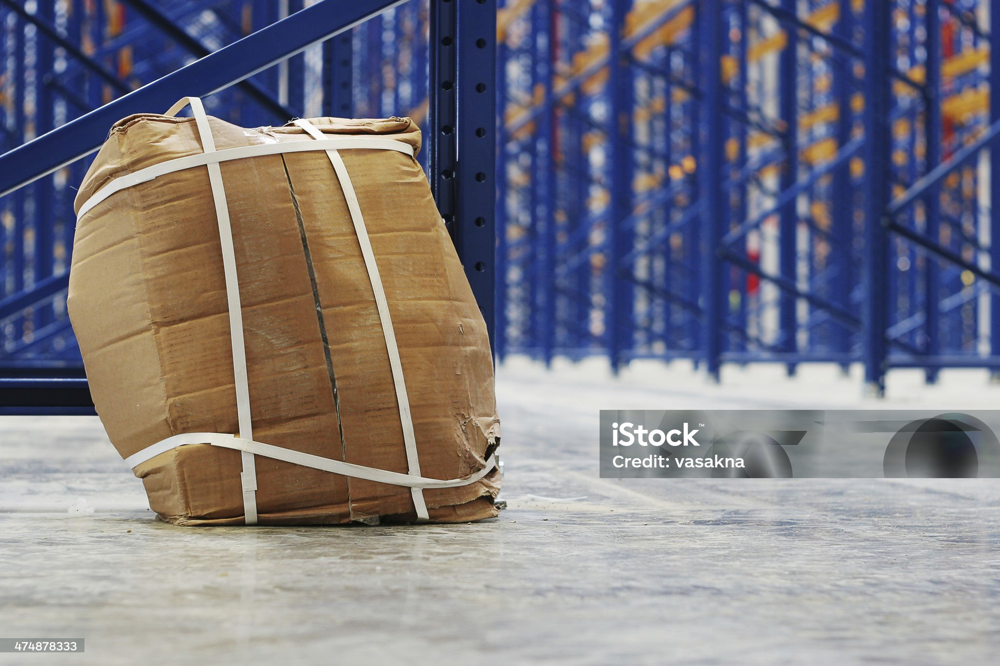

Custom labels detected: 1


In [166]:
bucket='hyogrin-custom-project1-us-east-1'
photo='reko-images/test/istockphoto-474878333-2048x2048.jpg'
model='arn:aws:rekognition:us-east-1:654405684375:project/damangedBoxPjt2/version/damangedBoxPjt2.2023-12-07T01.01.28/1701878488778'
min_confidence=90

label_count=show_custom_labels(model,bucket,photo, min_confidence)
print("Custom labels detected: " + str(label_count))

Detected custom labels for reko-images/test/istockphoto-520800288-612x612.jpg
Label normal
Confidence 61.45600128173828
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=612x408 at 0x7FBF1BA80EE0>


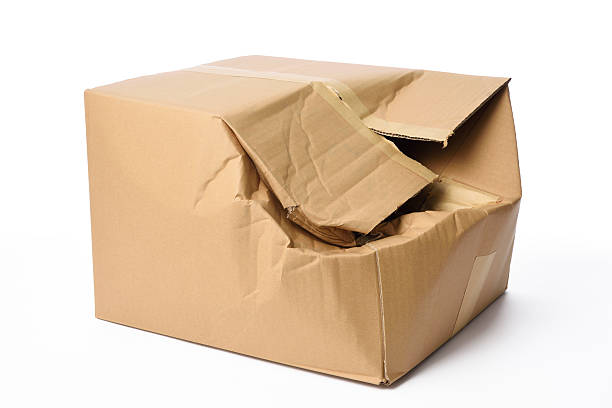

Custom labels detected: 1


In [170]:
bucket='hyogrin-custom-project1-us-east-1'
photo='reko-images/test/istockphoto-520800288-612x612.jpg'
model='arn:aws:rekognition:us-east-1:654405684375:project/damangedBoxPjt2/version/damangedBoxPjt2.2023-12-07T01.01.28/1701878488778'
min_confidence=50

label_count=show_custom_labels(model,bucket,photo, min_confidence)
print("Custom labels detected: " + str(label_count))